In [1]:
import torch
from sklearn.model_selection import train_test_split

# load data from data folder(we"re in notebooks folder)
sim_arr_tensor = torch.load('./data/sim_arr_tensor.pt')

# train test split
train_data, test_data = train_test_split(
    sim_arr_tensor, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(
    train_data, test_size=0.2, random_state=42)

/tmp/ipykernel_2010524/1126774367.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  sim_arr_tensor = torch.load('./data/sim_arr_tensor.pt')


In [2]:
from torch import nn

num_layers = 5
poolsize = [2, 2, 2, 2, 5]
channels = [3, 12, 7, 7, 11, 12]
kernel_sizes = [15, 10, 14, 14, 14]
dilations = [5, 5, 3, 3, 1]
activations = [nn.SiLU, nn.Tanh, nn.Softplus, nn.SiLU, nn.SiLU]
learning_rate = 0.0002568457560593339
batch_size = 32
epochs = 400

In [3]:
from models import vanilla
from models import train_cluster, evaluate

"""encoder = vanilla.Encoder(num_layers, poolsize, channels,
                          kernel_sizes, dilations, activations)
decoder = vanilla.Decoder(encoder)
model = vanilla.AutoEncoder(encoder, decoder)
"""
"""train_cluster(model, train_data, val_data,
      lr=learning_rate,
      batch_size=batch_size,
      epochs=epochs)"""
model = torch.load('./saved_models/vanilla_model.pt')
evaluate(model, test_data, batch_size=batch_size)

# torch.save(model, './saved_models/vanilla_model.pt')

/tmp/ipykernel_2010524/873456196.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('./saved_models/vanilla_model.pt')


Test Loss: 259.2862


259.28619040048795

In [5]:
from sklearn.cluster import HDBSCAN
from cluster_acc import purity, adj_rand_index

feature_array = model.feature_array(sim_arr_tensor)
print(feature_array.shape)

clustering = HDBSCAN(min_cluster_size=5,
                     cluster_selection_epsilon=0.5).fit(feature_array)
labels = clustering.labels_

print(f'Purity: {purity(labels)}')
print(f'ARI: {adj_rand_index(labels)}')

(3010, 12)
Purity: 0.6166112956810631
ARI: -0.00688219103385655


In [12]:
"""Plot a random reconstruction from the test set."""
import numpy as np
import matplotlib.pyplot as plt
import os


def recon(model, data, labels, i):
    """Plot a random reconstruction from the test set."""
    in_sim = data[i: i + 1]
    in_sim = in_sim.to('cuda:0')
    in_sim = in_sim.detach().to('cpu').numpy()
    in_sim = in_sim.reshape(
        in_sim.shape[0], in_sim.shape[2], in_sim.shape[3], in_sim.shape[1])
    plt.imshow(in_sim[0, ..., 2], vmin=-1, vmax=1, cmap="RdBu")

for i in range(len(labels)):
    print(f'Plotting image {i} in cluster {labels[i]}')
    # if they don't exist, create the directories to save the images in data/labelled_plots
    if not os.path.exists(f'./data/labelled_plots/{labels[i]}'):
        os.makedirs(f'./data/labelled_plots/{labels[i]}')
    
    # save the images in the appropriate directory
    recon(model, sim_arr_tensor, labels, i)
    plt.savefig(f'./data/labelled_plots/{labels[i]}/{i}.png')
    plt.close()


Plotting image 0 in cluster 10
Plotting image 1 in cluster 14
Plotting image 2 in cluster 10
Plotting image 3 in cluster 10
Plotting image 4 in cluster 10
Plotting image 5 in cluster 10
Plotting image 6 in cluster 13
Plotting image 7 in cluster 10
Plotting image 8 in cluster 10
Plotting image 9 in cluster 10
Plotting image 10 in cluster 10
Plotting image 11 in cluster 10
Plotting image 12 in cluster 13
Plotting image 13 in cluster 10
Plotting image 14 in cluster 10
Plotting image 15 in cluster 14
Plotting image 16 in cluster 10
Plotting image 17 in cluster 10
Plotting image 18 in cluster 10
Plotting image 19 in cluster 10
Plotting image 20 in cluster 10
Plotting image 21 in cluster 13
Plotting image 22 in cluster 10
Plotting image 23 in cluster 10
Plotting image 24 in cluster 10
Plotting image 25 in cluster 10
Plotting image 26 in cluster 14
Plotting image 27 in cluster 10
Plotting image 28 in cluster 10
Plotting image 29 in cluster 10
Plotting image 30 in cluster 10
Plotting image 31 

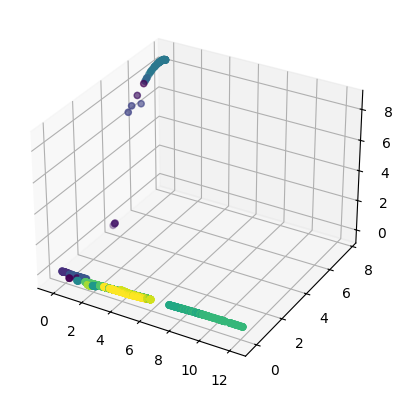

In [6]:
# plot the feature array in 3D with the labels as colors
import matplotlib.pyplot as plt

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# feature_array = feature_array[0].detach().to('cpu').numpy()
ax.scatter(feature_array[:, 0], feature_array[:, 1],
           feature_array[:, 2], c=labels)

In [7]:
from plot import class_config
class_config(labels)

Number of classes:  15


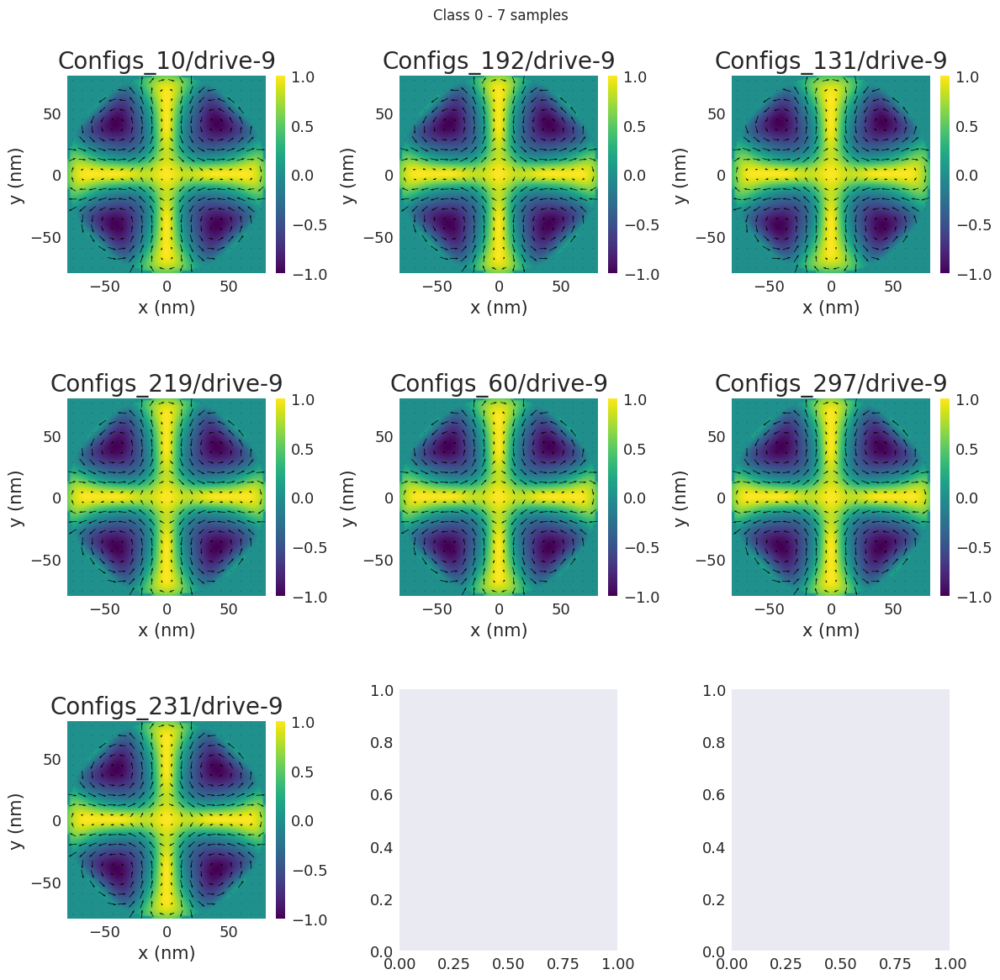

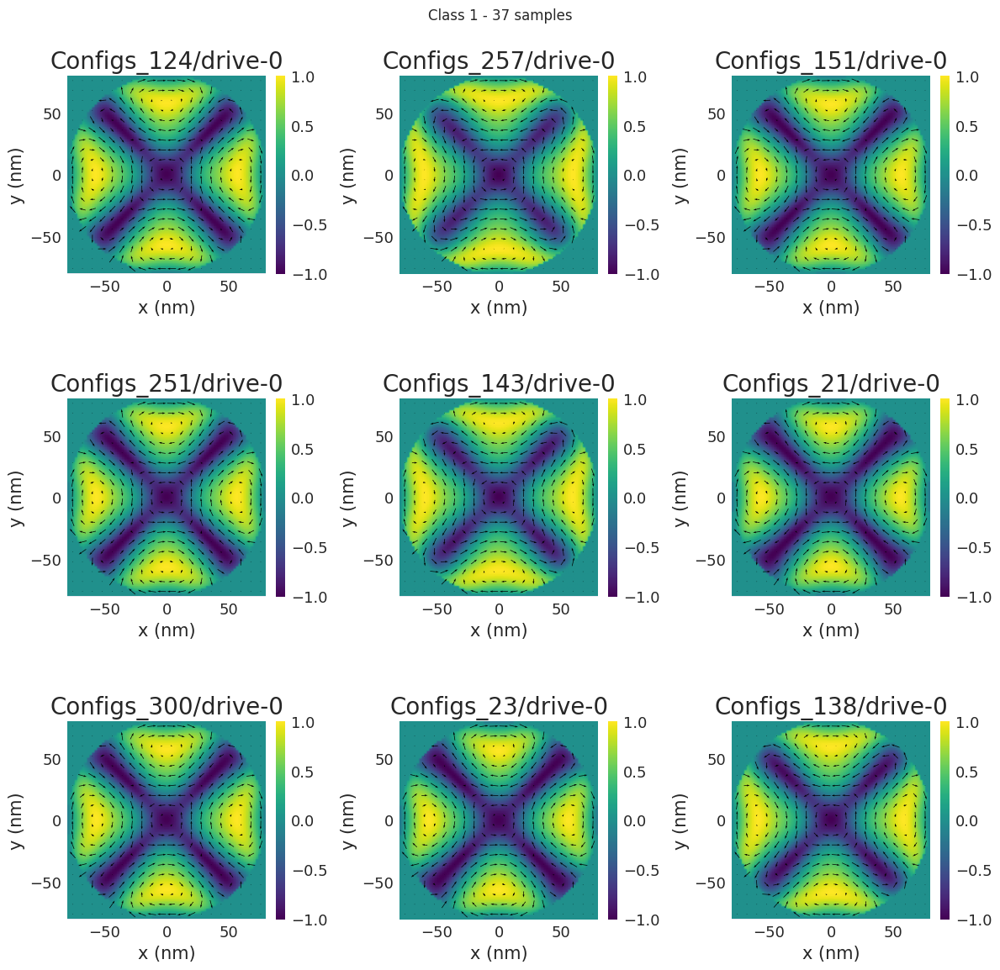

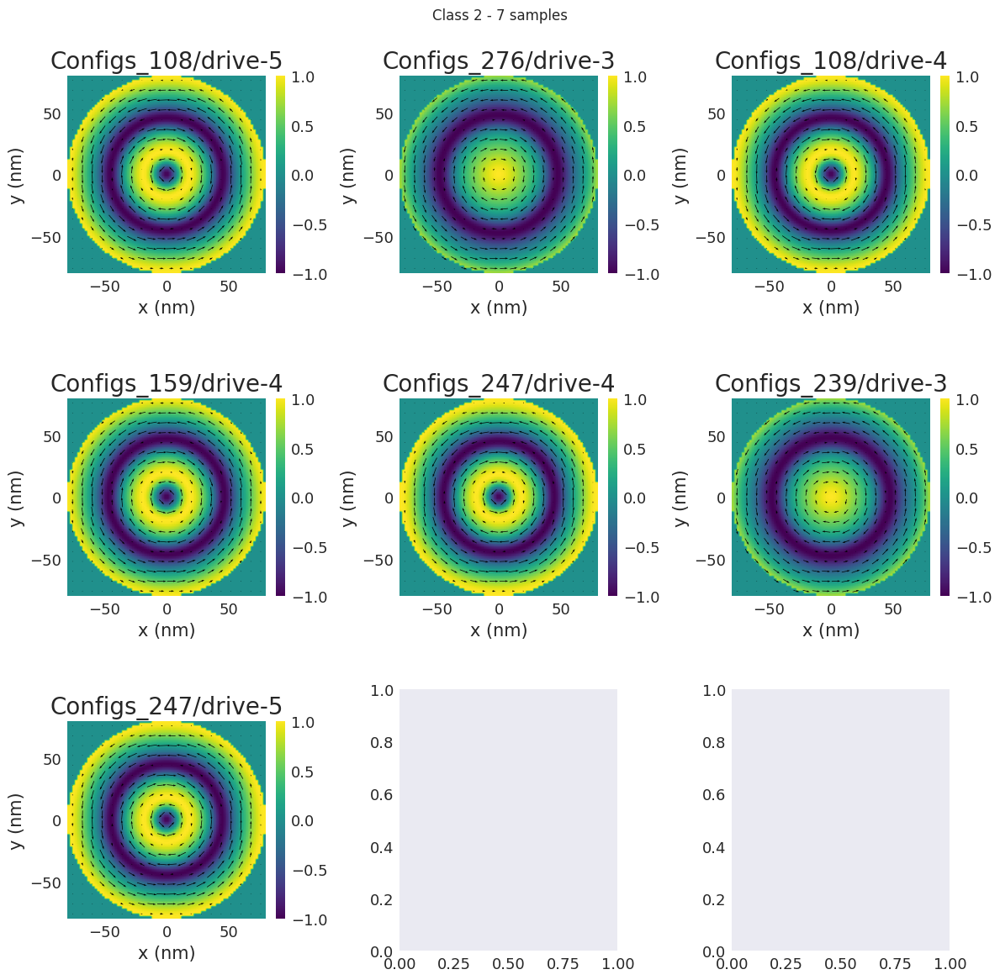

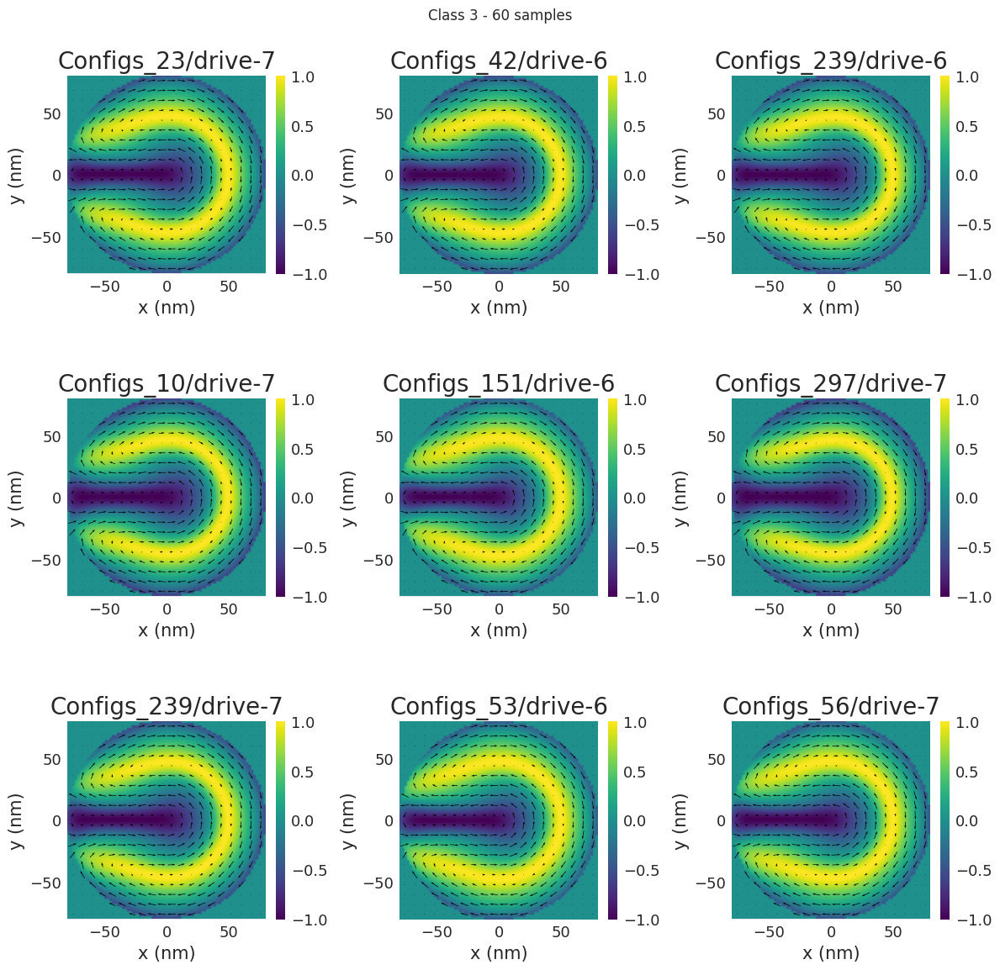

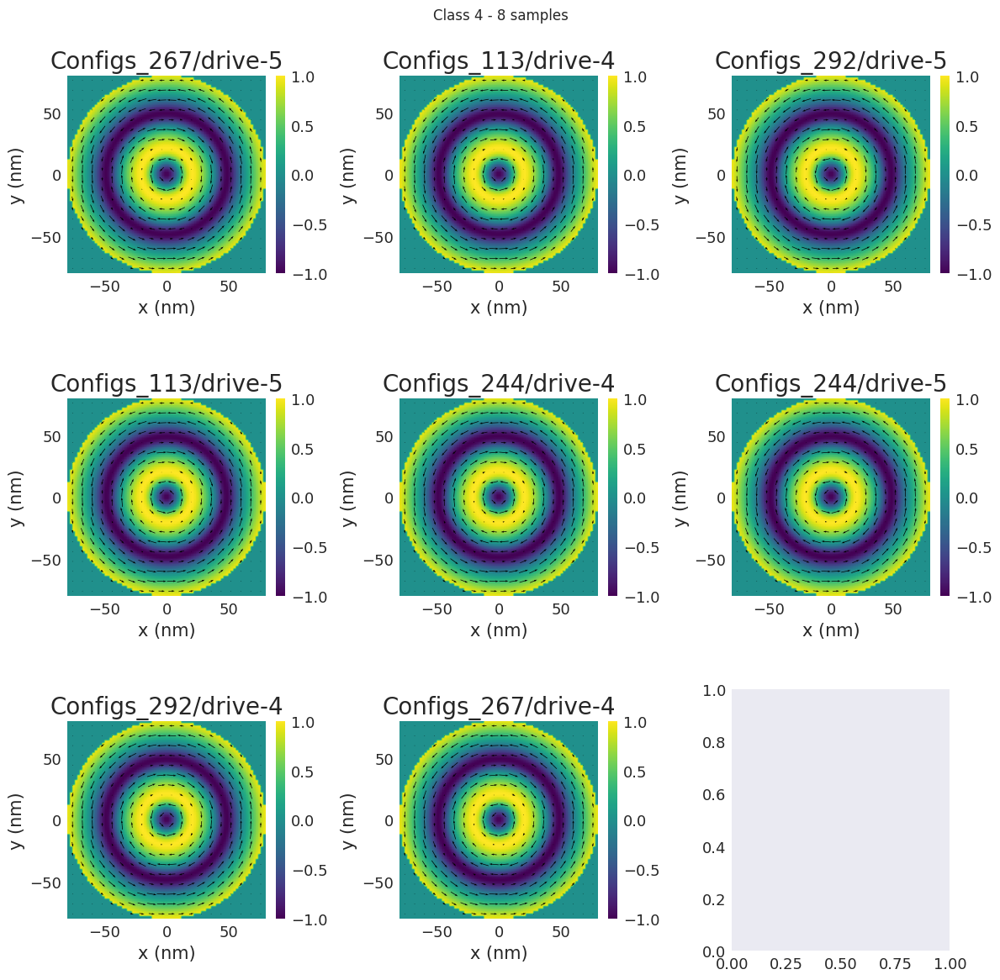

...

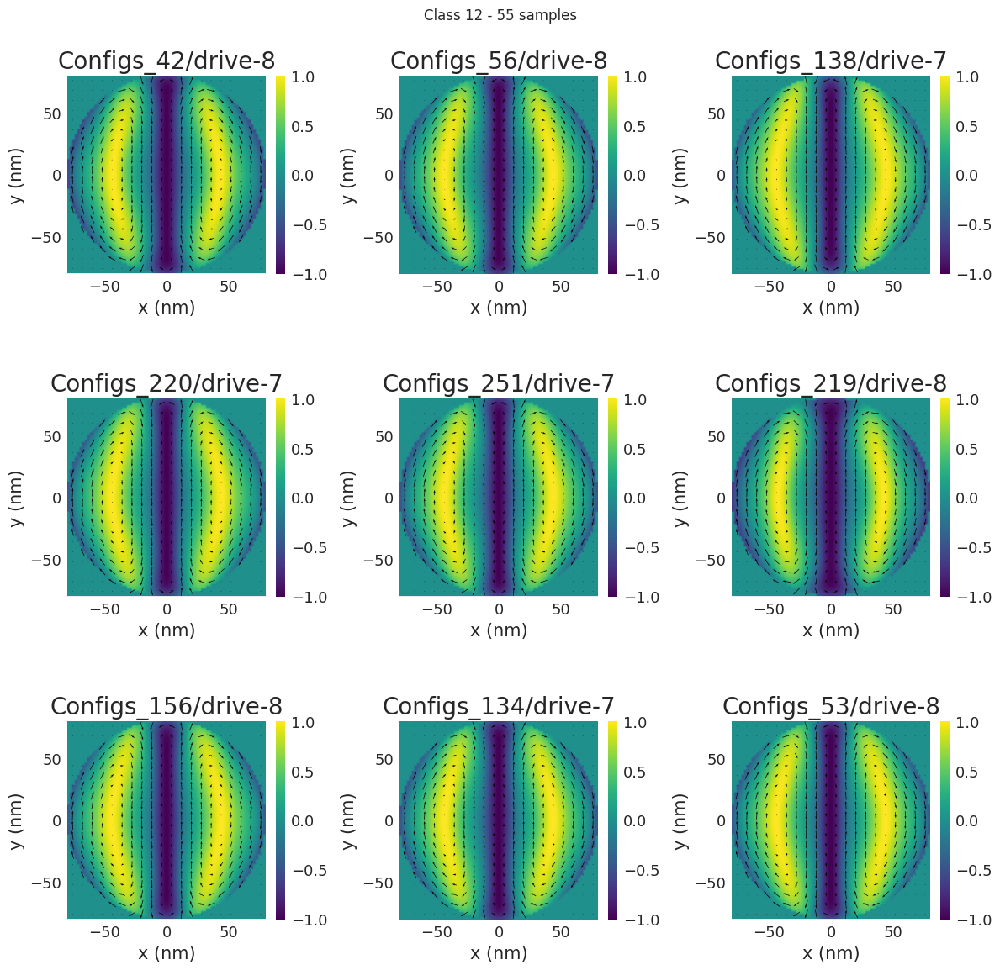

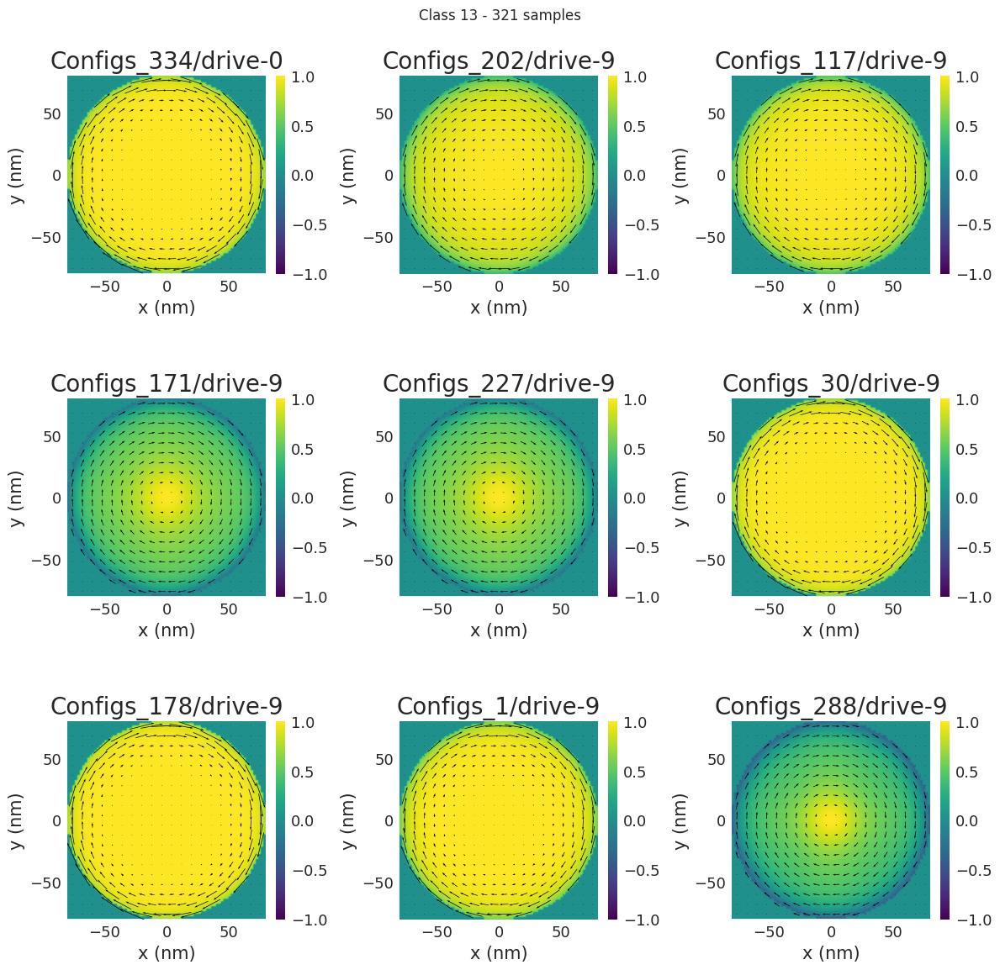

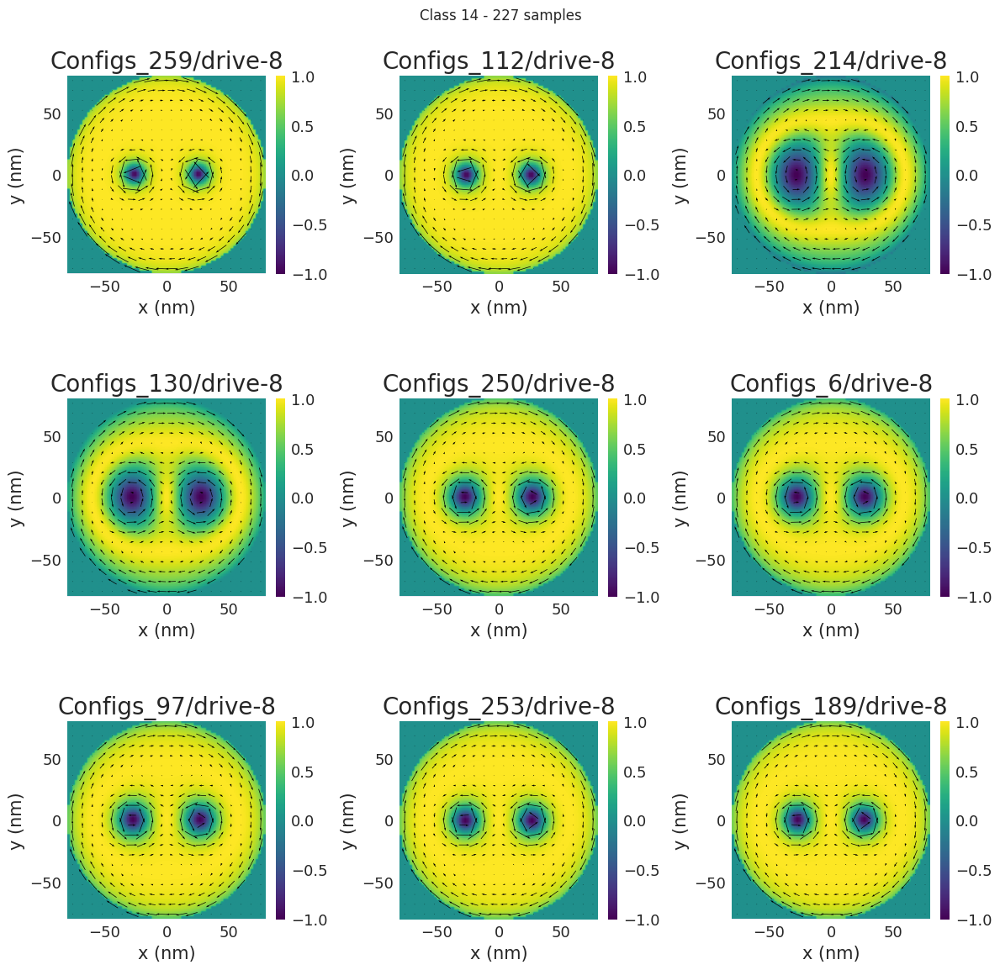

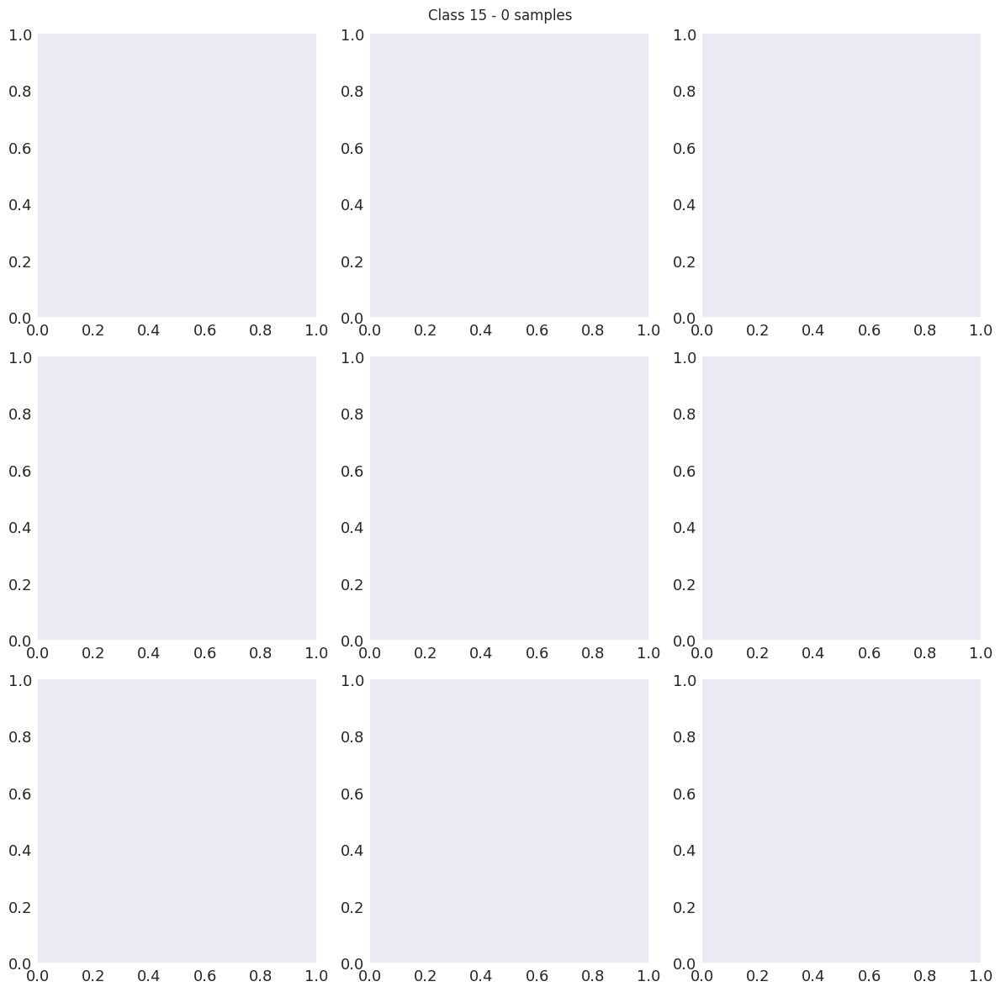

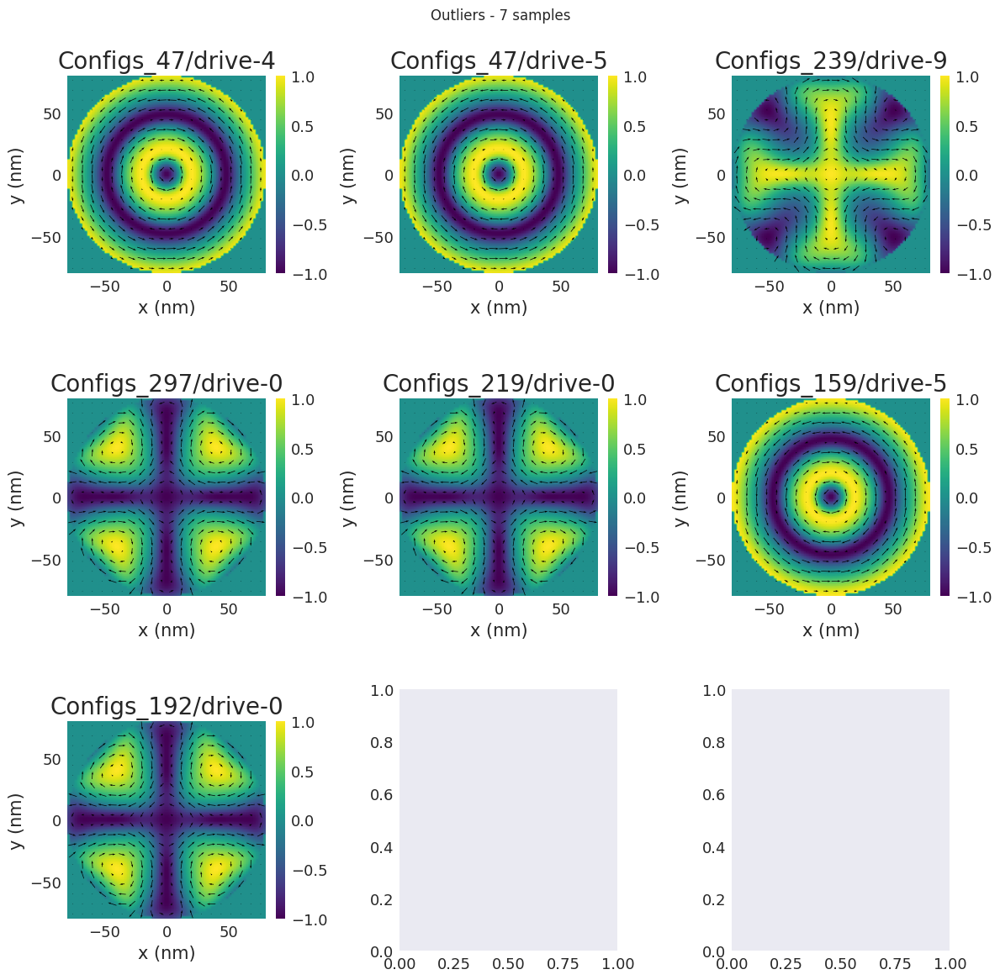

In [8]:
from plot import plot_all_examples

plot_all_examples(labels)